In [1]:
%load_ext lab_black

In [2]:
from collections import Counter


def load_map(file):
    with open(file) as f:
        report = f.read()
    if report.endswith("\n"):
        report = report[:-1]
    return report


def clean_coords(lines_in):
    lines = lines_in.split("\n")
    pairs_str = [x.split(" -> ") for x in lines]
    pairs_str
    coords_str = [[x.split(",") for x in row] for row in pairs_str]
    coords = [[tuple([int(x), int(y)]) for x, y in row] for row in coords_str]
    return coords


def expand(pair, part="one"):
    xs = [pair[0][0], pair[1][0]]
    ys = [pair[0][1], pair[1][1]]
    if part == "one":
        if xs[0] != xs[1] and ys[0] != ys[1]:
            return []
    if xs[0] != xs[1]:
        if xs[1] > xs[0]:
            step = 1
        else:
            step = -1
        xs_exp = list(range(xs[0], xs[1] + step, step))
    if ys[0] != ys[1]:
        if ys[1] > ys[0]:
            step = 1
        else:
            step = -1
        ys_exp = list(range(ys[0], ys[1] + step, step))
    if xs[0] == xs[1]:
        xs_exp = [xs[0] for x in ys_exp]
    if ys[0] == ys[1]:
        ys_exp = [ys[0] for x in xs_exp]
    if len(xs_exp) != len(ys_exp):
        print(pair)
        print(xs_exp)
        print(ys_exp)
    return [tuple([x, y]) for x, y in zip(xs_exp, ys_exp)]


def get_points(coords, part="one"):
    points = []
    for row in coords:
        temp_row = expand(row, part=part)
        points += temp_row
    return points


def print_map(counter):
    points = list(counter.keys())
    xmin = 0
    ymin = 0
    xmax = max([p[0] for p in points])
    ymax = max([p[1] for p in points])

    rows = []
    for y in range(ymin, ymax + 1):
        row = ""
        for x in range(xmin, xmax + 1):
            p = tuple([x, y])
            if p in counter.keys():
                row += str(counter[p])
            else:
                row += "."
        rows.append(row)

    print("\n".join(rows))

In [3]:
inp = load_map("../data/05_input.txt")
coords = clean_coords(inp)
points = get_points(coords, part="two")
counter = Counter(points)
count_intersections = len([x for x in counter.values() if x > 1])
print(f"Number of intersections: {count_intersections}")

Number of intersections: 20012


In [4]:
import pandas as pd

In [5]:
df = pd.DataFrame(points, columns=["x", "y"])
df["intersections"] = 1
df = df.groupby(["x", "y"]).sum().reset_index().sort_values("intersections")
matrix = df.pivot(index="x", columns="y", values="intersections").fillna(0)

In [7]:
import plotly.express as px

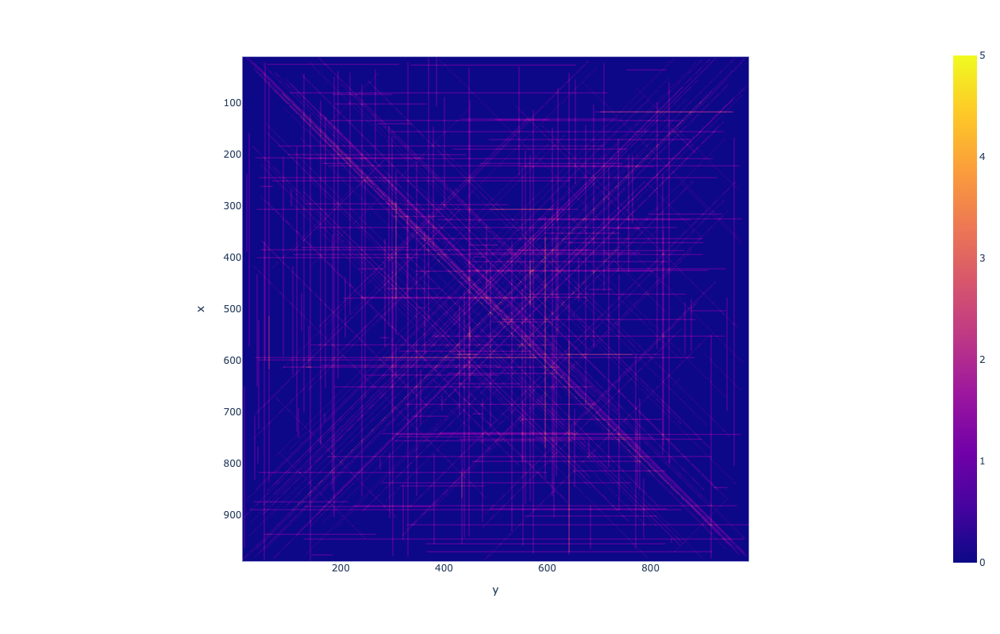

In [10]:
px.imshow(matrix, width=800, height=800)

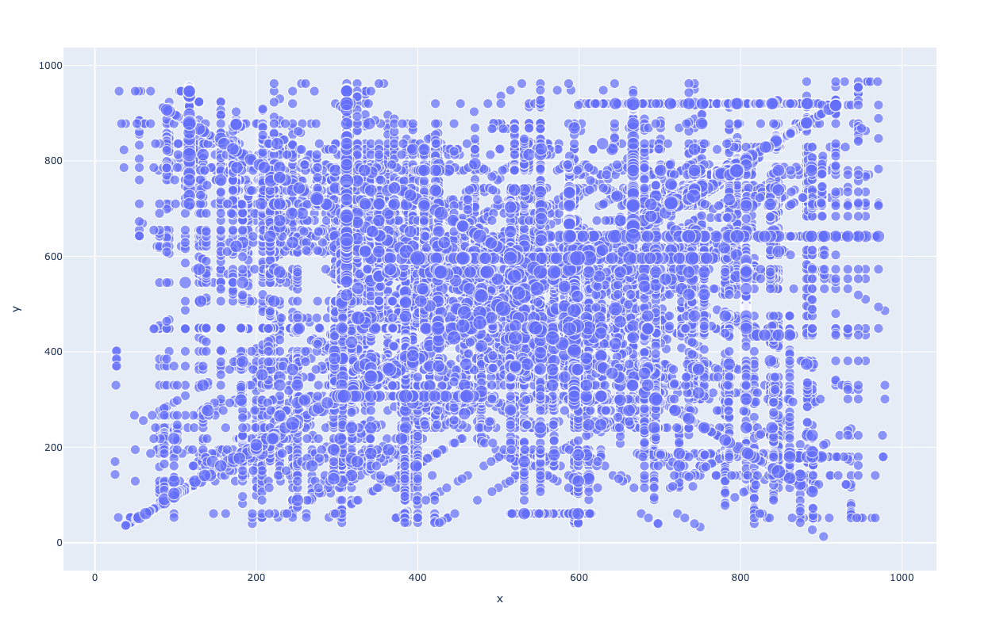

In [16]:
px.scatter(
    df.loc[df.intersections > 1],
    x="x",
    y="y",
    size="intersections",
    height=800,
    width=800,
    a
)

In [15]:
df.loc[(df.x > 1) | (df.y > 1)]

,x,y,intersections
0,11,385,1
112673,617,739,1
112675,617,754,1
112676,617,756,1
112677,617,761,1
...,...,...,...
121975,667,642,5
86558,506,490,5
111833,612,596,5
108508,598,596,5
